In [125]:
import sys
import os

# Navigate up one level to the parent directory and append it to sys.path
sys.path.append(os.path.abspath(os.path.join(os.getcwd(), os.pardir)))

import nfl_data_py as nfl
import pandas as pd
import numpy as np
import statsmodels.api as sm
import statsmodels.formula.api as smf
from scipy.stats import poisson

from src import utils

import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt

pd.set_option('display.max_columns', None)

In [86]:
flatten_grouped_cols = lambda cols: list(map("_".join, cols))

def lag_df(df: pd.DataFrame, index_cols:list, cols_to_lag: list, lag_on='season') -> pd.DataFrame:
    df_cur = df[index_cols + cols_to_lag].copy()
    df_prev = df_cur.copy()
    df_prev = df_prev.rename(columns={col: f'{col}_last' for col in cols_to_lag})
    df_prev[lag_on] += 1
    return df_cur.merge(df_prev, how='inner', on=index_cols)

# 1. Football Analytics

The goal of this chapter is to get familiar with nfl_data_py and analyze QB ADOT

In [3]:
pbp = nfl.import_pbp_data([2023])

2023 done.
Downcasting floats.


In [45]:
filter_criteria = 'play_type=="pass" & air_yards.notnull()'

pass_pbp = (
    pbp.query(filter_criteria)
    # .groupby(['passer_id', 'passer'])
    .groupby(['passer', 'posteam'])
    .agg({'air_yards': ['count', 'mean'], 'epa':'mean'})
)

pass_pbp.columns = list(map('_'.join, pass_pbp.columns.values))
pass_pbp = pass_pbp[pass_pbp['air_yards_count'] >= 100].sort_values('air_yards_mean', ascending=False).reset_index()
pass_pbp

,passer,posteam,air_yards_count,air_yards_mean,epa_mean
0,D.Watson,CLE,107,9.794393,-0.040751
1,R.Tannehill,TEN,157,9.375796,0.096253
2,J.Love,GB,234,9.333333,0.042378
3,D.Carr,NO,282,8.829787,0.102541
4,J.Hurts,PHI,282,8.765958,0.202284
5,M.Stafford,LA,275,8.574546,0.151826
6,J.Allen,BUF,285,8.470176,0.259472
7,J.Dobbs,ARI,266,8.263158,-0.022246
8,C.Stroud,HOU,232,8.232759,0.230595
9,B.Mayfield,TB,246,8.154471,0.088271


In [59]:
fig = px.scatter(pass_pbp, x='air_yards_mean', y='epa_mean', text='passer', color='posteam', color_discrete_map=utils.team_primary_colors, opacity=0)
fig.update_layout(
    height=600,
    width=1000,
    xaxis_title=f'Mean ADOT',
    yaxis_title='EPA per Play',
    title='QB EPA per Play by Mean ADOT',
    # subheader='min 100 pass attempts',
)
fig.update_traces(showlegend=False, textposition='bottom center')

# Iterate through the data and add logos to the chart
for index, row in pass_pbp.iterrows():
    team = row['posteam']
    scale = .16
    fig.add_layout_image(
        dict(source=f'https://a.espncdn.com/i/teamlogos/nfl/500/{team}.png',
            x=row['air_yards_mean'],
            y=row['epa_mean'],
            xref="x",
            yref="y",
            sizex=scale,  # Adjust the size
            sizey=scale,  # Adjust the size
            sizing="contain",
            opacity=.6,
            xanchor="center",
            yanchor="middle",        
            layer="below",
        )
    )

fig.show()

# 2. Stable vs Unstable QB Metrics

## Pass Data Prep

In [3]:
pbp = pd.DataFrame(nfl.import_pbp_data(range(2016, 2023)))
pbp.shape

2016 done.
2017 done.
2018 done.
2019 done.
2020 done.
2021 done.
2022 done.
Downcasting floats.


(341697, 384)

In [4]:
# filter to only passing data
pbp_p = pbp.query("play_type == 'pass' & air_yards.notnull()").reset_index()

In [5]:
# categorize passes as either long or short
pbp_p['pass_length_air_yards'] = np.where(pbp_p['air_yards'] >= 20, 'long', 'short')
# fill in pass yards as 0's if they are indeed null
pbp_p['passing_yards'] = pbp_p['passing_yards'].fillna(0)

In [6]:
pbp_p['passing_yards'].describe()

count    131606.000000
mean          7.192111
std           9.667647
min         -20.000000
25%           0.000000
50%           5.000000
75%          11.000000
max          98.000000
Name: passing_yards, dtype: float64

In [7]:
pbp_p.query('pass_length_air_yards == "long"')['passing_yards'].describe()

count    15519.000000
mean        12.168761
std         17.923370
min          0.000000
25%          0.000000
50%          0.000000
75%         26.000000
max         98.000000
Name: passing_yards, dtype: float64

In [8]:
pbp_p.query('pass_length_air_yards == "short"')['passing_yards'].describe()

count    116087.000000
mean          6.526812
std           7.695791
min         -20.000000
25%           0.000000
50%           5.000000
75%          10.000000
max          95.000000
Name: passing_yards, dtype: float64

In [9]:
pbp_p.query('pass_length_air_yards == "long"')['epa'].describe()

count    15519.000000
mean         0.382649
std          2.185549
min        -10.477921
25%         -0.827421
50%         -0.465344
75%          2.136431
max          8.789743
Name: epa, dtype: float64

In [10]:
pbp_p.query('pass_length_air_yards == "short"')['epa'].describe()

count    116086.000000
mean          0.119606
std           1.426229
min         -13.031219
25%          -0.606135
50%          -0.002100
75%           0.959107
max           8.241420
Name: epa, dtype: float64

In [11]:
px.histogram(pbp, x='passing_yards', height=500, width=800)

In [12]:
px.box(pbp_p, 
        x='pass_length_air_yards', 
        y='passing_yards',
        height=600, 
        width=500
    )

In [13]:
pbp_p_s = pbp_p.groupby(['passer_id', 'passer', 'season']).agg({'passing_yards': ['mean', 'count']})
pbp_p_s.columns = list(map('_'.join, pbp_p_s.columns))
pbp_p_s = pbp_p_s.rename(columns={
    'passing_yards_mean': 'ypa',
    'passing_yards_count': 'n',
})
pbp_p_s = pbp_p_s.query('n >= 100').sort_values(by='ypa', ascending=False)
pbp_p_s.head()

,,,ypa,n
passer_id,passer,season,,
00-0023682,R.Fitzpatrick,2018,9.617887,246
00-0026143,M.Ryan,2016,9.442155,631
00-0029701,R.Tannehill,2019,9.069971,343
00-0033537,D.Watson,2020,8.898524,542
00-0036212,T.Tagovailoa,2022,8.892231,399


## The Hypothesis

*Throwing Deep Passes is more valuable than short passes, but it is difficult to say whether or not a quarterback is good at deep passes*

In [16]:
# play-by-play, pass data, by season, by pass length
pbp_p_s_pl = pbp_p.groupby(['passer_id', 'passer', 'season', 'pass_length_air_yards']).agg({'passing_yards': ['mean', 'count']})
pbp_p_s_pl.columns = list(map('_'.join, pbp_p_s_pl.columns))
pbp_p_s_pl = pbp_p_s_pl.rename(columns={
    'passing_yards_mean': 'ypa',
    'passing_yards_count': 'n',
})
pbp_p_s_pl = pbp_p_s_pl.reset_index()
criteria = '(n >= 100 & pass_length_air_yards=="short") | (n >= 30 & pass_length_air_yards=="long")'
pbp_p_s_pl = pbp_p_s_pl.query(criteria).reset_index()

In [18]:
air_yards = pbp_p_s_pl[['passer_id', 'passer', 'season', 'pass_length_air_yards', 'ypa']].copy()

In [19]:
# get the lag from the prior season
air_yards_lag = air_yards.copy().rename(columns={'ypa': 'ypa_last'})
air_yards_lag['season'] += 1

In [20]:
# join back to the main df
pbp_p_s_pl = (
    air_yards.merge(air_yards_lag, 
                    how="inner",
                    on=["passer_id", "passer", "season", "pass_length_air_yards"]
                )
)

In [26]:
pbp_p_s_pl.query('passer=="P.Mahomes" or passer == "B.Mayfield"').sort_values(['passer', 'season'])

,passer_id,passer,season,pass_length_air_yards,ypa,ypa_last
255,00-0034855,B.Mayfield,2019,long,11.613334,12.958904
256,00-0034855,B.Mayfield,2019,short,6.468271,6.778049
257,00-0034855,B.Mayfield,2020,long,13.857142,11.613334
258,00-0034855,B.Mayfield,2020,short,6.456033,6.468271
259,00-0034855,B.Mayfield,2021,long,12.150000,13.857142
260,00-0034855,B.Mayfield,2021,short,6.407303,6.456033
261,00-0034855,B.Mayfield,2022,short,5.678689,6.407303
238,00-0033873,P.Mahomes,2019,long,17.012196,14.627451
239,00-0033873,P.Mahomes,2019,short,6.881323,7.610200
240,00-0033873,P.Mahomes,2020,long,11.101266,17.012196


In [34]:
assert not pbp_p_s_pl.isnull().any().any()
print(f'{pbp_p_s_pl["passer_id"].nunique()} quarterbacks in the sample')

65 quarterbacks in the sample


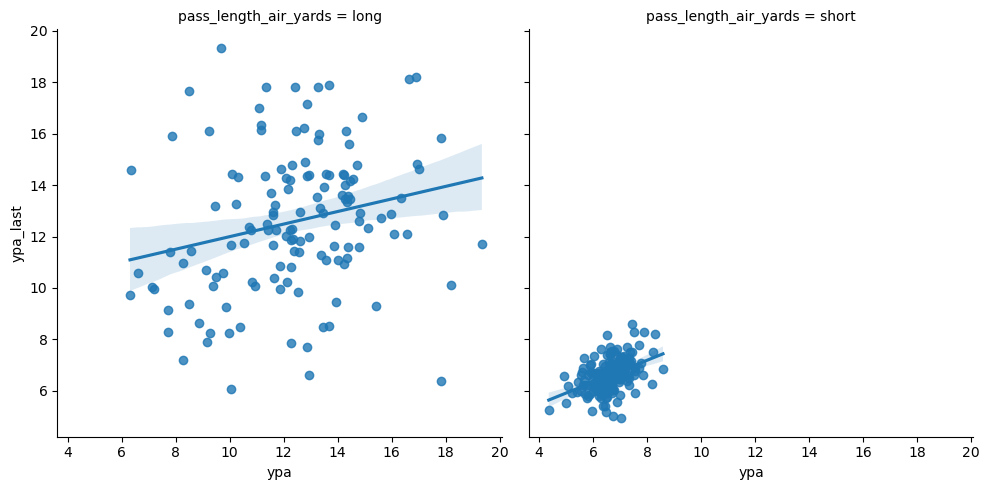

In [35]:
# scatterplot for yard per attempt season and previous season
sns.lmplot(
    data=pbp_p_s_pl,
    x='ypa',
    y='ypa_last',
    col='pass_length_air_yards'
)

In [37]:
pbp_p_s_pl.groupby('pass_length_air_yards')[['ypa', 'ypa_last']].corr()

ypa  ypa_last
pass_length_air_yards                             
long                  ypa       1.000000  0.233890
                      ypa_last  0.233890  1.000000
short                 ypa       1.000000  0.438479
                      ypa_last  0.438479  1.000000

We can now confirm that throwing deep passes is more valuable than throwing short passes, however it is difficult to say whether or not a quarterback is good at throwing deep passes.

In [ ]:
# Trying the same approach but for epa

In [38]:
# play-by-play, pass data, by season, by pass length
pbp_p_s_pl = pbp_p.groupby(['passer_id', 'passer', 'season', 'pass_length_air_yards']).agg({'epa': ['mean', 'count']})
pbp_p_s_pl.columns = list(map('_'.join, pbp_p_s_pl.columns))
pbp_p_s_pl = pbp_p_s_pl.rename(columns={
    'epa_mean': 'epa_p',
    'epa_count': 'n',
})
pbp_p_s_pl = pbp_p_s_pl.reset_index()
criteria = '(n >= 100 & pass_length_air_yards=="short") | (n >= 30 & pass_length_air_yards=="long")'
pbp_p_s_pl = pbp_p_s_pl.query(criteria).reset_index()

In [39]:
air_yards = pbp_p_s_pl[['passer_id', 'passer', 'season', 'pass_length_air_yards', 'epa_p']].copy()

In [40]:
# get the lag from the prior season
air_yards_lag = air_yards.copy().rename(columns={'epa_p': 'epa_p_last'})
air_yards_lag['season'] += 1

In [41]:
# join back to the main df
pbp_p_s_pl = (
    air_yards.merge(air_yards_lag, 
                    how="inner",
                    on=["passer_id", "passer", "season", "pass_length_air_yards"]
                )
)

In [42]:
pbp_p_s_pl.query('passer=="P.Mahomes" or passer == "B.Mayfield"').sort_values(['passer', 'season'])

,passer_id,passer,season,pass_length_air_yards,epa_p,epa_p_last
255,00-0034855,B.Mayfield,2019,long,0.224483,0.551573
256,00-0034855,B.Mayfield,2019,short,0.069357,0.081391
257,00-0034855,B.Mayfield,2020,long,0.471847,0.224483
258,00-0034855,B.Mayfield,2020,short,0.221533,0.069357
259,00-0034855,B.Mayfield,2021,long,0.391008,0.471847
260,00-0034855,B.Mayfield,2021,short,0.115127,0.221533
261,00-0034855,B.Mayfield,2022,short,-0.035070,0.115127
238,00-0033873,P.Mahomes,2019,long,1.144922,0.648732
239,00-0033873,P.Mahomes,2019,short,0.207115,0.380629
240,00-0033873,P.Mahomes,2020,long,0.380278,1.144922


In [43]:
assert not pbp_p_s_pl.isnull().any().any()
print(f'{pbp_p_s_pl["passer_id"].nunique()} quarterbacks in the sample')

65 quarterbacks in the sample


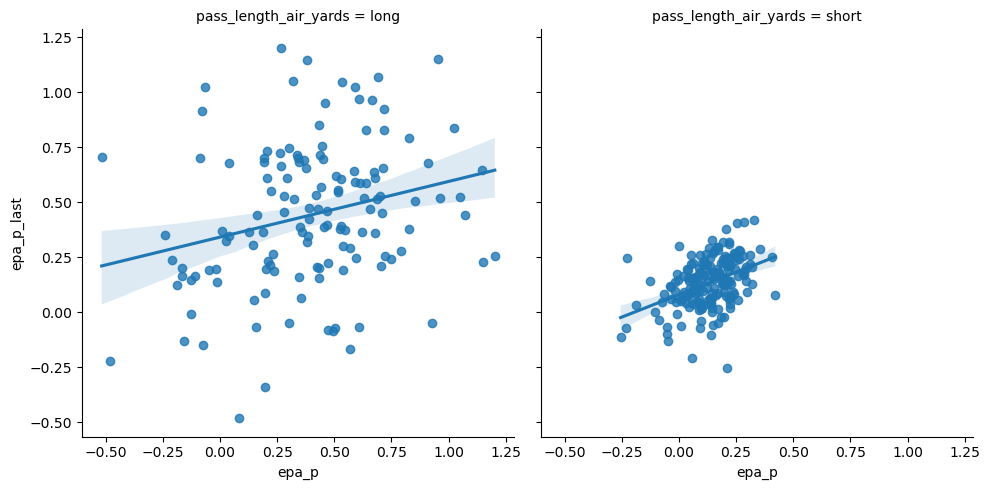

In [44]:
# scatterplot for yard per attempt season and previous season
sns.lmplot(
    data=pbp_p_s_pl,
    x='epa_p',
    y='epa_p_last',
    col='pass_length_air_yards'
)

In [46]:
pbp_p_s_pl.groupby('pass_length_air_yards')[['epa_p', 'epa_p_last']].corr()

epa_p  epa_p_last
pass_length_air_yards                                 
long                  epa_p       1.000000    0.256137
                      epa_p_last  0.256137    1.000000
short                 epa_p       1.000000    0.413426
                      epa_p_last  0.413426    1.000000

Epa is not that different than yards per play when trying to evaluate quarterback play. It is more valuable to throw deep passes but less likely to translate year to year.

# 3. Simple Linear Regression: Rushing Yards over Expected

## Data Wrangling and EDA

In [2]:
pbp = pd.DataFrame(nfl.import_pbp_data(range(2016, 2022 + 1)))

2016 done.
2017 done.
2018 done.
2019 done.
2020 done.
2021 done.
2022 done.
Downcasting floats.


In [9]:
criteria = "play_type == 'run' & rusher_id.notnull()"
pbp_run = pbp.query(criteria).reset_index()
pbp_run['rushing_yards'] = pbp_run['rushing_yards'].fillna(0)
pbp_run.head()

,index,play_id,game_id,old_game_id,home_team,away_team,season_type,week,posteam,posteam_type,defteam,side_of_field,yardline_100,game_date,quarter_seconds_remaining,half_seconds_remaining,game_seconds_remaining,game_half,quarter_end,drive,sp,qtr,down,goal_to_go,time,yrdln,ydstogo,ydsnet,desc,play_type,yards_gained,shotgun,no_huddle,qb_dropback,qb_kneel,qb_spike,qb_scramble,pass_length,pass_location,air_yards,yards_after_catch,run_location,run_gap,field_goal_result,kick_distance,extra_point_result,two_point_conv_result,home_timeouts_remaining,away_timeouts_remaining,timeout,timeout_team,td_team,td_player_name,td_player_id,posteam_timeouts_remaining,defteam_timeouts_remaining,total_home_score,total_away_score,posteam_score,defteam_score,score_differential,posteam_score_post,defteam_score_post,score_differential_post,no_score_prob,opp_fg_prob,opp_safety_prob,opp_td_prob,fg_prob,safety_prob,td_prob,extra_point_prob,two_point_conversion_prob,ep,epa,total_home_epa,total_away_epa,total_home_rush_epa,total_away_rush_epa,total_home_pass_epa,total_away_pass_epa,air_epa,yac_epa,comp_air_epa,comp_yac_epa,total_home_comp_air_epa,total_away_comp_air_epa,total_home_comp_yac_epa,total_away_comp_yac_epa,total_home_raw_air_epa,total_away_raw_air_epa,total_home_raw_yac_epa,total_away_raw_yac_epa,wp,def_wp,home_wp,away_wp,wpa,vegas_wpa,vegas_home_wpa,home_wp_post,away_wp_post,vegas_wp,vegas_home_wp,total_home_rush_wpa,total_away_rush_wpa,total_home_pass_wpa,total_away_pass_wpa,air_wpa,yac_wpa,comp_air_wpa,comp_yac_wpa,total_home_comp_air_wpa,total_away_comp_air_wpa,total_home_comp_yac_wpa,total_away_comp_yac_wpa,total_home_raw_air_wpa,total_away_raw_air_wpa,total_home_raw_yac_wpa,total_away_raw_yac_wpa,punt_blocked,first_down_rush,first_down_pass,first_down_penalty,third_down_converted,third_down_failed,fourth_down_converted,fourth_down_failed,incomplete_pass,touchback,interception,punt_inside_twenty,punt_in_endzone,punt_out_of_bounds,punt_downed,punt_fair_catch,kickoff_inside_twenty,kickoff_in_endzone,kickoff_out_of_bounds,kickoff_downed,kickoff_fair_catch,fumble_forced,fumble_not_forced,fumble_out_of_bounds,solo_tackle,safety,penalty,tackled_for_loss,fumble_lost,own_kickoff_recovery,own_kickoff_recovery_td,qb_hit,rush_attempt,pass_attempt,sack,touchdown,pass_touchdown,rush_touchdown,return_touchdown,extra_point_attempt,two_point_attempt,field_goal_attempt,kickoff_attempt,punt_attempt,fumble,complete_pass,assist_tackle,lateral_reception,lateral_rush,lateral_return,lateral_recovery,passer_player_id,passer_player_name,passing_yards,receiver_player_id,receiver_player_name,receiving_yards,rusher_player_id,rusher_player_name,rushing_yards,lateral_receiver_player_id,lateral_receiver_player_name,lateral_receiving_yards,lateral_rusher_player_id,lateral_rusher_player_name,lateral_rushing_yards,lateral_sack_player_id,lateral_sack_player_name,interception_player_id,interception_player_name,lateral_interception_player_id,lateral_interception_player_name,punt_returner_player_id,punt_returner_player_name,lateral_punt_returner_player_id,lateral_punt_returner_player_name,kickoff_returner_player_name,kickoff_returner_player_id,lateral_kickoff_returner_player_id,lateral_kickoff_returner_player_name,punter_player_id,punter_player_name,kicker_player_name,kicker_player_id,own_kickoff_recovery_player_id,own_kickoff_recovery_player_name,blocked_player_id,blocked_player_name,tackle_for_loss_1_player_id,tackle_for_loss_1_player_name,tackle_for_loss_2_player_id,tackle_for_loss_2_player_name,qb_hit_1_player_id,qb_hit_1_player_name,qb_hit_2_player_id,qb_hit_2_player_name,forced_fumble_player_1_team,forced_fumble_player_1_player_id,forced_fumble_player_1_player_name,forced_fumble_player_2_team,forced_fumble_player_2_player_id,forced_fumble_player_2_player_name,solo_tackle_1_team,solo_tackle_2_team,solo_tackle_1_player_id,solo_tackle_2_player_id,solo_tackle_1_player_name,solo_tackle_2_player_name,assist_tackle_1_player_id,assist_tackle_1_player_name,assist_tackle_1_team,assis

<Axes: xlabel='ydstogo', ylabel='rushing_yards'>

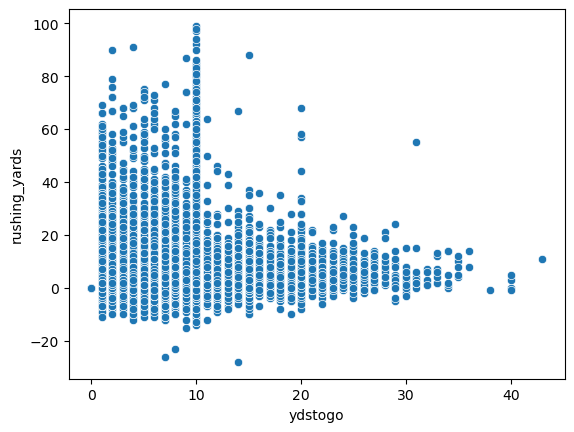

In [10]:
sns.scatterplot(pbp_run, x='ydstogo', y='rushing_yards')

<Axes: xlabel='ydstogo', ylabel='rushing_yards'>

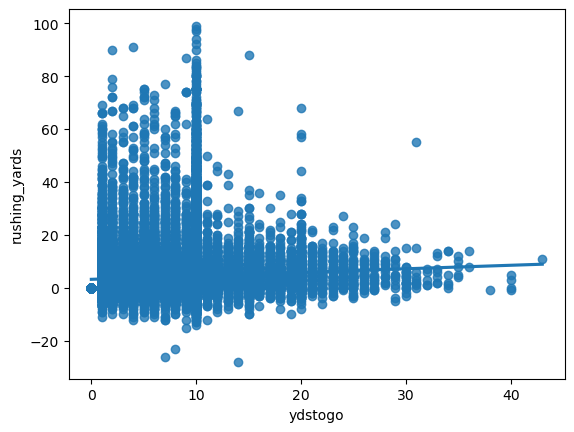

In [11]:
sns.regplot(pbp_run, x='ydstogo', y='rushing_yards')

In [15]:
pbp_run_avg = pbp_run.groupby('ydstogo').agg({'rushing_yards': ['mean']})
pbp_run_avg.columns = list(map('_'.join, pbp_run_avg.columns))
pbp_run_avg = pbp_run_avg.reset_index()

<Axes: xlabel='ydstogo', ylabel='rushing_yards_mean'>

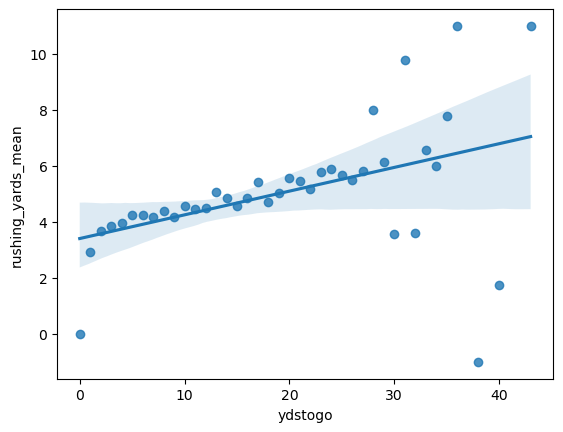

In [17]:
sns.regplot(pbp_run_avg, x='ydstogo', y='rushing_yards_mean')

## Rush Yards Over Expectation 

In [19]:
yards_to_go = smf.ols('rushing_yards ~ 1 + ydstogo', pbp_run)
yards_to_go.fit().summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          rushing_yards   R-squared:                       0.007
Model:                            OLS   Adj. R-squared:                  0.007
Method:                 Least Squares   F-statistic:                     623.7
Date:                Wed, 08 Nov 2023   Prob (F-statistic):          3.34e-137
Time:                        21:38:30   Log-Likelihood:            -3.0107e+05
No. Observations:               92425   AIC:                         6.021e+05
Df Residuals:                   92423   BIC:                         6.022e+05
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      3.2188      0.047     68.142      0.000       3.126       3.311
ydstogo        0.1329      0.005     24.974      0.000       0.122       0.143
==============================================================================
Omnibus:                    81985.726   Durbin-Watson:                   1.994
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          4086040.920
Skew:                           4.126   Prob(JB):                         0.00
Kurtosis:                      34.511   Cond. No.                         20.5
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [20]:
# save the residuals 
pbp_run['ryoe'] = yards_to_go.fit().resid

In [32]:
ryoe = pbp_run.groupby(['season', 'rusher_id', 'rusher']).agg({'ryoe': ['count', 'sum', 'mean'], 'rushing_yards':['mean']})
ryoe.columns = flatten_grouped_cols(ryoe)
ryoe = (
    ryoe.reset_index()
    .rename(columns={
        'ryoe_count': 'n',
        'ryoe_sum': 'ryoe_total',
        'ryoe_mean': 'ryoe_per',
        'rushing_yards_mean': 'yards_per_carry',
    })
    .query('n>=50')
    .sort_values('ryoe_total', ascending=False)
)

In [34]:
ryoe.head(20)

,season,rusher_id,rusher,n,ryoe_total,ryoe_per,yards_per_carry
1989,2021,00-0036223,J.Taylor,332,417.501295,1.257534,5.454819
1440,2020,00-0032764,D.Henry,397,362.768406,0.913774,5.206549
1258,2019,00-0034796,L.Jackson,135,353.652105,2.619645,6.800000
1143,2019,00-0032764,D.Henry,387,323.921354,0.837006,5.131783
1474,2020,00-0033293,A.Jones,222,288.358241,1.298911,5.540541
1102,2019,00-0031687,R.Mostert,190,281.715695,1.482714,5.831579
318,2016,00-0033045,E.Elliott,344,278.567232,0.809788,5.104651
1900,2021,00-0034791,N.Chubb,228,275.856257,1.209896,5.521930
2235,2022,00-0034796,L.Jackson,73,275.839751,3.778627,7.821918
1559,2020,00-0034791,N.Chubb,221,253.772344,1.148291,5.475113


In [35]:
ryoe.sort_values('ryoe_per', ascending=False).head(20)

,season,rusher_id,rusher,n,ryoe_total,ryoe_per,yards_per_carry
2235,2022,00-0034796,L.Jackson,73,275.839751,3.778627,7.821918
1258,2019,00-0034796,L.Jackson,135,353.652105,2.619645,6.800000
1286,2019,00-0035228,K.Murray,56,121.698571,2.173189,6.500000
1560,2020,00-0034796,L.Jackson,121,249.477338,2.061796,6.264463
1897,2021,00-0034750,R.Penny,119,229.243077,1.926412,6.294117
2377,2022,00-0036945,J.Fields,85,159.605741,1.877715,6.000000
2165,2022,00-0033357,T.Hill,96,178.171063,1.855949,5.989583
1870,2021,00-0034253,D.Hilliard,56,100.656428,1.797436,6.250000
2229,2022,00-0034750,R.Penny,57,99.151099,1.739493,6.070176
1236,2019,00-0034400,J.Wilkins,51,87.834539,1.722246,6.019608


## Cool, now is RYOE a more predictive metric than YPC?

In [46]:
# lag the df
ryoe_lag = lag_df(ryoe, index_cols=['season', 'rusher_id', 'rusher'], cols_to_lag=['ryoe_per', 'yards_per_carry'], lag_on='season')

In [48]:
ryoe_lag

,season,rusher_id,rusher,ryoe_per,yards_per_carry,ryoe_per_last,yards_per_carry_last
0,2021,00-0036223,J.Taylor,1.257534,5.454819,0.693631,4.909449
1,2020,00-0032764,D.Henry,0.913774,5.206549,0.837006,5.131783
2,2019,00-0034796,L.Jackson,2.619645,6.800000,0.814846,4.983471
3,2019,00-0032764,D.Henry,0.837006,5.131783,0.603681,4.925581
4,2020,00-0033293,A.Jones,1.298911,5.540541,0.205935,4.468401
...,...,...,...,...,...,...,...
289,2017,00-0023500,F.Gore,-0.653701,3.681992,-0.401569,3.897338
290,2018,00-0027029,L.McCoy,-1.188218,3.192547,-0.361534,3.964052
291,2019,00-0032741,P.Barber,-1.246043,3.032258,-0.603798,3.722222
292,2017,00-0029613,D.Martin,-1.427780,2.920863,-1.383032,2.923611


In [49]:
ryoe_lag[['yards_per_carry', 'yards_per_carry_last']].corr()

,yards_per_carry,yards_per_carry_last
yards_per_carry,1.00000,0.32261
yards_per_carry_last,0.32261,1.00000


In [50]:
ryoe_lag[['ryoe_per', 'ryoe_per_last']].corr()

,ryoe_per,ryoe_per_last
ryoe_per,1.000000,0.348923
ryoe_per_last,0.348923,1.000000


In conclusion, yes RYOE is a *slightly* more stable metric of a running back's performance than yards per carry from season to season

# 4. Multiple Regression: Rushing Yards over Expected

### Data Prep

In [52]:
pbp = pd.DataFrame(nfl.import_pbp_data(range(2016, 2022 + 1)))

2016 done.
2017 done.
2018 done.
2019 done.
2020 done.
2021 done.
2022 done.
Downcasting floats.


In [59]:
criteria = "play_type == 'run' & rusher_id.notnull() & down.notnull() & run_location.notnull()"
pbp_run = pbp.query(criteria).reset_index()
pbp_run['rushing_yards'] = pbp_run['rushing_yards'].fillna(0)
# convert downs to strings so they are interpreted as discrete and not continuous
pbp_run["down"] = pbp_run["down"].astype(str) 
pbp_run.head()

,index,play_id,game_id,old_game_id,home_team,away_team,season_type,week,posteam,posteam_type,defteam,side_of_field,yardline_100,game_date,quarter_seconds_remaining,half_seconds_remaining,game_seconds_remaining,game_half,quarter_end,drive,sp,qtr,down,goal_to_go,time,yrdln,ydstogo,ydsnet,desc,play_type,yards_gained,shotgun,no_huddle,qb_dropback,qb_kneel,qb_spike,qb_scramble,pass_length,pass_location,air_yards,yards_after_catch,run_location,run_gap,field_goal_result,kick_distance,extra_point_result,two_point_conv_result,home_timeouts_remaining,away_timeouts_remaining,timeout,timeout_team,td_team,td_player_name,td_player_id,posteam_timeouts_remaining,defteam_timeouts_remaining,total_home_score,total_away_score,posteam_score,defteam_score,score_differential,posteam_score_post,defteam_score_post,score_differential_post,no_score_prob,opp_fg_prob,opp_safety_prob,opp_td_prob,fg_prob,safety_prob,td_prob,extra_point_prob,two_point_conversion_prob,ep,epa,total_home_epa,total_away_epa,total_home_rush_epa,total_away_rush_epa,total_home_pass_epa,total_away_pass_epa,air_epa,yac_epa,comp_air_epa,comp_yac_epa,total_home_comp_air_epa,total_away_comp_air_epa,total_home_comp_yac_epa,total_away_comp_yac_epa,total_home_raw_air_epa,total_away_raw_air_epa,total_home_raw_yac_epa,total_away_raw_yac_epa,wp,def_wp,home_wp,away_wp,wpa,vegas_wpa,vegas_home_wpa,home_wp_post,away_wp_post,vegas_wp,vegas_home_wp,total_home_rush_wpa,total_away_rush_wpa,total_home_pass_wpa,total_away_pass_wpa,air_wpa,yac_wpa,comp_air_wpa,comp_yac_wpa,total_home_comp_air_wpa,total_away_comp_air_wpa,total_home_comp_yac_wpa,total_away_comp_yac_wpa,total_home_raw_air_wpa,total_away_raw_air_wpa,total_home_raw_yac_wpa,total_away_raw_yac_wpa,punt_blocked,first_down_rush,first_down_pass,first_down_penalty,third_down_converted,third_down_failed,fourth_down_converted,fourth_down_failed,incomplete_pass,touchback,interception,punt_inside_twenty,punt_in_endzone,punt_out_of_bounds,punt_downed,punt_fair_catch,kickoff_inside_twenty,kickoff_in_endzone,kickoff_out_of_bounds,kickoff_downed,kickoff_fair_catch,fumble_forced,fumble_not_forced,fumble_out_of_bounds,solo_tackle,safety,penalty,tackled_for_loss,fumble_lost,own_kickoff_recovery,own_kickoff_recovery_td,qb_hit,rush_attempt,pass_attempt,sack,touchdown,pass_touchdown,rush_touchdown,return_touchdown,extra_point_attempt,two_point_attempt,field_goal_attempt,kickoff_attempt,punt_attempt,fumble,complete_pass,assist_tackle,lateral_reception,lateral_rush,lateral_return,lateral_recovery,passer_player_id,passer_player_name,passing_yards,receiver_player_id,receiver_player_name,receiving_yards,rusher_player_id,rusher_player_name,rushing_yards,lateral_receiver_player_id,lateral_receiver_player_name,lateral_receiving_yards,lateral_rusher_player_id,lateral_rusher_player_name,lateral_rushing_yards,lateral_sack_player_id,lateral_sack_player_name,interception_player_id,interception_player_name,lateral_interception_player_id,lateral_interception_player_name,punt_returner_player_id,punt_returner_player_name,lateral_punt_returner_player_id,lateral_punt_returner_player_name,kickoff_returner_player_name,kickoff_returner_player_id,lateral_kickoff_returner_player_id,lateral_kickoff_returner_player_name,punter_player_id,punter_player_name,kicker_player_name,kicker_player_id,own_kickoff_recovery_player_id,own_kickoff_recovery_player_name,blocked_player_id,blocked_player_name,tackle_for_loss_1_player_id,tackle_for_loss_1_player_name,tackle_for_loss_2_player_id,tackle_for_loss_2_player_name,qb_hit_1_player_id,qb_hit_1_player_name,qb_hit_2_player_id,qb_hit_2_player_name,forced_fumble_player_1_team,forced_fumble_player_1_player_id,forced_fumble_player_1_player_name,forced_fumble_player_2_team,forced_fumble_player_2_player_id,forced_fumble_player_2_player_name,solo_tackle_1_team,solo_tackle_2_team,solo_tackle_1_player_id,solo_tackle_2_player_id,solo_tackle_1_player_name,solo_tackle_2_player_name,assist_tackle_1_player_id,assist_tackle_1_player_name,assist_tackle_1_team,assis

### Variable: Down

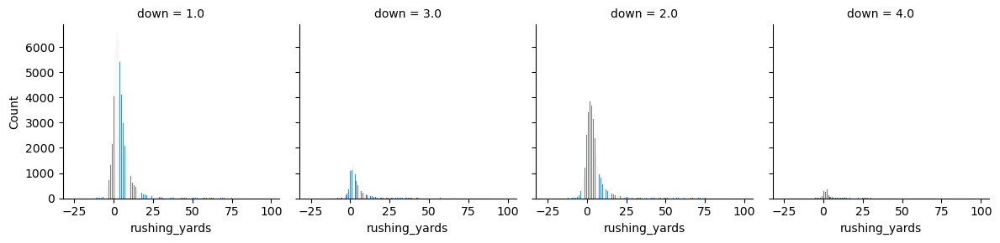

In [60]:
g = sns.FacetGrid(
    data=pbp_run,
    col="down"
)

g.map_dataframe(sns.histplot, x="rushing_yards")

<Axes: xlabel='down', ylabel='rushing_yards'>

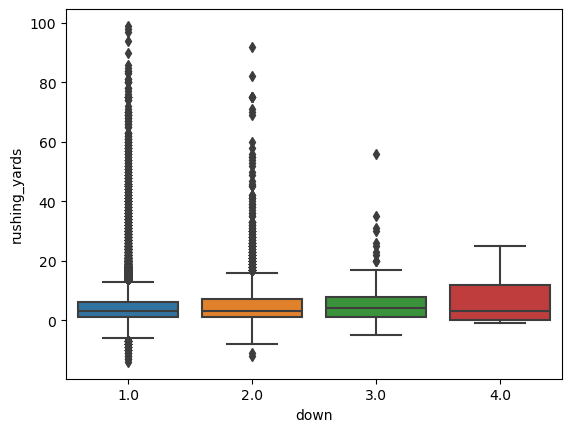

In [62]:
sns.boxplot(data=pbp_run.query('ydstogo == 10'), x='down', y='rushing_yards')

### Variable: Yards to Go

<Axes: xlabel='yardline_100', ylabel='rushing_yards'>

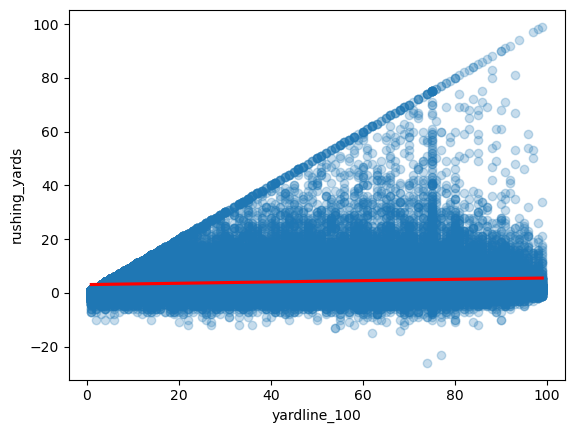

In [65]:
sns.regplot(
    data=pbp_run,
    x='yardline_100',
    y='rushing_yards',
    scatter_kws={'alpha':0.25},
    line_kws={'color':'red'},
)

In [66]:
# bin the data by yards to go
pbp_run_y100 = (
    pbp_run.groupby('yardline_100')
    .agg({'rushing_yards':['mean']})
)
pbp_run_y100.columns = flatten_grouped_cols(pbp_run_y100.columns)
pbp_run_y100 = pbp_run_y100.reset_index()

<Axes: xlabel='yardline_100', ylabel='rushing_yards_mean'>

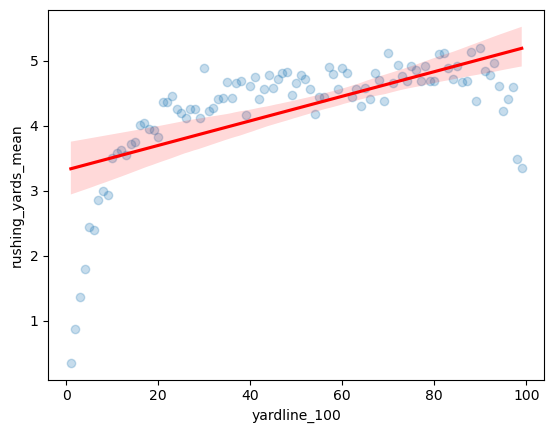

In [67]:
sns.regplot(
    data=pbp_run_y100,
    x='yardline_100',
    y='rushing_yards_mean',
    scatter_kws={'alpha':0.25},
    line_kws={'color':'red'},
)

### Variable: Run Location

<Axes: xlabel='run_location', ylabel='rushing_yards'>

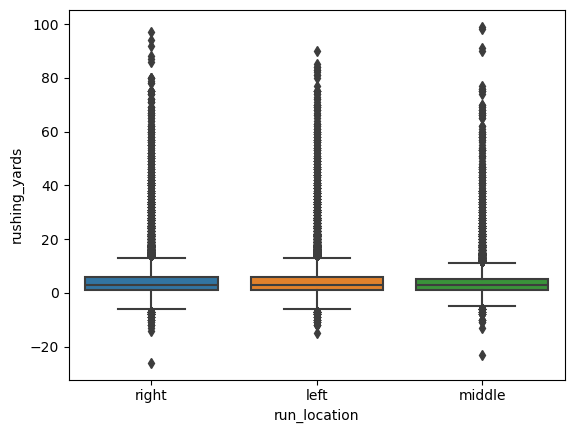

In [70]:
sns.boxplot(
    data=pbp_run,
    x='run_location',
    y='rushing_yards',
)

### Variable: Score Differential

<Axes: xlabel='score_differential', ylabel='rushing_yards'>

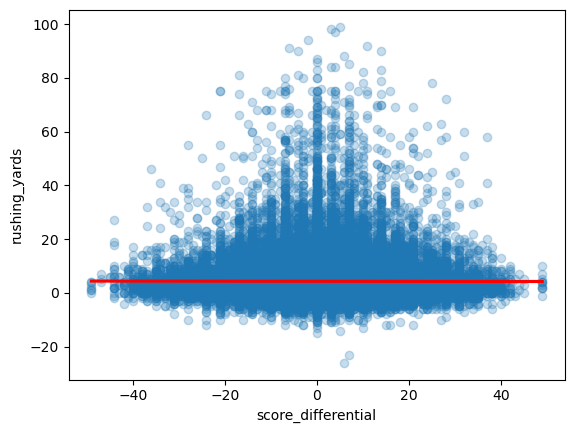

In [71]:
sns.regplot(
    data=pbp_run,
    x='score_differential',
    y='rushing_yards',
    scatter_kws={'alpha':0.25},
    line_kws={'color':'red'},
)

In [72]:
# bin the data by yards to go
pbp_run_sd = (
    pbp_run.groupby('score_differential')
    .agg({'rushing_yards':['mean']})
)
pbp_run_sd.columns = flatten_grouped_cols(pbp_run_sd.columns)
pbp_run_sd = pbp_run_sd.reset_index()

<Axes: xlabel='score_differential', ylabel='rushing_yards_mean'>

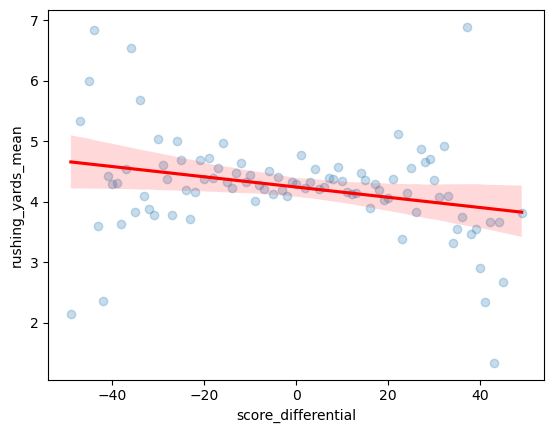

In [73]:
sns.regplot(
    data=pbp_run_sd,
    x='score_differential',
    y='rushing_yards_mean',
    scatter_kws={'alpha':0.25},
    line_kws={'color':'red'},
)

### Takeaways

These variables all showed a relationship with rushing yards:
* down
* yards to go
* run location
* score differential

## Generalised Linear Modelling: RYOE

In [77]:
expected_yards = smf.ols(
    data=pbp_run,
    formula='rushing_yards ~ 1 + down + ydstogo + down:ydstogo + yardline_100 + run_location + score_differential'
).fit()
expected_yards.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:          rushing_yards   R-squared:                       0.016
Model:                            OLS   Adj. R-squared:                  0.016
Method:                 Least Squares   F-statistic:                     136.6
Date:                Sat, 11 Nov 2023   Prob (F-statistic):          3.43e-313
Time:                        12:28:24   Log-Likelihood:            -2.9764e+05
No. Observations:               91442   AIC:                         5.953e+05
Df Residuals:                   91430   BIC:                         5.954e+05
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==========================================================================================
                             coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------------------
Intercept                  1.6085      0.136     11.849      0.000       1.342       1.875
down[T.2.0]                1.6153      0.153     10.577      0.000       1.316       1.915
down[T.3.0]                1.2846      0.161      7.990      0.000       0.969       1.600
down[T.4.0]                0.2844      0.249      1.142      0.254      -0.204       0.773
run_location[T.middle]    -0.5634      0.053    -10.718      0.000      -0.666      -0.460
run_location[T.right]     -0.0382      0.049     -0.784      0.433      -0.134       0.057
ydstogo                    0.2024      0.014     14.439      0.000       0.175       0.230
down[T.2.0]:ydstogo       -0.1466      0.016     -8.957      0.000      -0.179      -0.115
down[T.3.0]:ydstogo       -0.0437      0.019     -2.323      0.020      -0.081      -0.007
down[T.4.0]:ydstogo        0.2302      0.090      2.567      0.010       0.054       0.406
yardline_100               0.0186      0.001     21.230      0.000       0.017       0.020
score_differential        -0.0040      0.002     -2.023      0.043      -0.008      -0.000
==============================================================================
Omnibus:                    80510.527   Durbin-Watson:                   1.979
Prob(Omnibus):                  0.000   Jarque-Bera (JB):          3941200.520
Skew:                           4.082   Prob(JB):                         0.00
Kurtosis:                      34.109   Cond. No.                         838.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [76]:
pbp_run['ryoe'] = expected_yards.resid

In [78]:
ryoe = pbp_run.groupby(['season', 'rusher_id', 'rusher']).agg({'ryoe': ['count', 'sum', 'mean'], 'rushing_yards':['mean']})
ryoe.columns = flatten_grouped_cols(ryoe)
ryoe = (
    ryoe.reset_index()
    .rename(columns={
        'ryoe_count': 'n',
        'ryoe_sum': 'ryoe_total',
        'ryoe_mean': 'ryoe_per',
        'rushing_yards_mean': 'yards_per_carry',
    })
    .query('n>=50')
    .sort_values('ryoe_total', ascending=False)
)

In [79]:
ryoe.head(20)

,season,rusher_id,rusher,n,ryoe_total,ryoe_per,yards_per_carry
1870,2021,00-0036223,J.Taylor,332,471.232840,1.419376,5.454819
1350,2020,00-0032764,D.Henry,395,345.948778,0.875820,5.232912
1183,2019,00-0034796,L.Jackson,126,328.524757,2.607339,6.880952
1069,2019,00-0032764,D.Henry,386,311.641243,0.807361,5.145078
1383,2020,00-0033293,A.Jones,221,301.778866,1.365515,5.565611
2103,2022,00-0034796,L.Jackson,72,280.752317,3.899338,7.930555
1032,2019,00-0031687,R.Mostert,190,274.039537,1.442313,5.831579
294,2016,00-0033045,E.Elliott,342,273.571224,0.799916,5.137427
1467,2020,00-0034796,L.Jackson,118,258.059489,2.186945,6.415254
1788,2021,00-0034791,N.Chubb,228,248.123035,1.088259,5.521930


In [80]:
ryoe.sort_values('ryoe_per', ascending=False).head(20)

,season,rusher_id,rusher,n,ryoe_total,ryoe_per,yards_per_carry
2103,2022,00-0034796,L.Jackson,72,280.752317,3.899338,7.930555
1183,2019,00-0034796,L.Jackson,126,328.524757,2.607339,6.880952
1210,2019,00-0035228,K.Murray,53,137.636412,2.596913,6.867925
2239,2022,00-0036945,J.Fields,77,177.409631,2.304021,6.506494
1467,2020,00-0034796,L.Jackson,118,258.059489,2.186945,6.415254
348,2017,00-0027939,C.Newton,92,191.234750,2.078639,6.173913
1498,2020,00-0035228,K.Murray,70,143.897956,2.055685,6.057143
1785,2021,00-0034750,R.Penny,119,241.576540,2.030055,6.294117
1161,2019,00-0034400,J.Wilkins,51,97.757362,1.916811,6.019608
2037,2022,00-0033357,T.Hill,95,171.219477,1.802310,6.052631


## Is the generalised RYOE model more stable than the simple model?

In [81]:
# lag the df
ryoe_lag = lag_df(ryoe, index_cols=['season', 'rusher_id', 'rusher'], cols_to_lag=['ryoe_per'], lag_on='season')

In [82]:
ryoe_lag

,season,rusher_id,rusher,ryoe_per,ryoe_per_last
0,2021,00-0036223,J.Taylor,1.419376,0.817560
1,2020,00-0032764,D.Henry,0.875820,0.807361
2,2019,00-0034796,L.Jackson,2.607339,1.139845
3,2019,00-0032764,D.Henry,0.807361,0.672871
4,2020,00-0033293,A.Jones,1.365515,0.200585
...,...,...,...,...,...
288,2017,00-0023500,F.Gore,-0.697433,-0.441170
289,2018,00-0031045,C.Hyde,-1.103118,-0.455492
290,2017,00-0029613,D.Martin,-1.387161,-1.351913
291,2018,00-0027029,L.McCoy,-1.294365,-0.504090


In [84]:
ryoe_lag[['ryoe_per', 'ryoe_per_last']].corr()

,ryoe_per,ryoe_per_last
ryoe_per,1.000000,0.373582
ryoe_per_last,0.373582,1.000000


Yes! we have improved the correlation from 0.34 to 0.37, a small but positive increase!

# 5. Generalized Linear Models: Completion Percentage over Expected

## Data Prep

In [97]:
pbp = pd.DataFrame(nfl.import_pbp_data(range(2016, 2022 + 1)))
criteria = 'play_type=="pass" & passer_id.notnull() & air_yards.notnull()'
pbp_pass = (
    pbp.query(criteria)
    .reset_index()
)

2016 done.
2017 done.
2018 done.
2019 done.
2020 done.
2021 done.
2022 done.
Downcasting floats.


In [101]:
pass_pct = (
    pbp_pass.query('0 < air_yards <= 20')
    .groupby('air_yards')
    .agg({'complete_pass':['mean']})
)
pass_pct.columns = flatten_grouped_cols(pass_pct.columns)
pass_pct = pass_pct.reset_index().rename(columns={'complete_pass_mean':'comp_pct'})

<Axes: xlabel='air_yards', ylabel='comp_pct'>

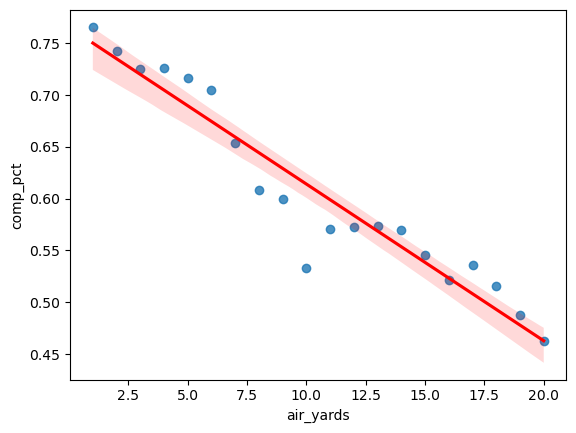

In [102]:
sns.regplot(pass_pct, x='air_yards', y='comp_pct', line_kws={'color':'red'})

## Simple GLM Completion Percentage and Air Yards

In [104]:
complete_ay = (
    smf.glm(formula='complete_pass ~ air_yards', 
            data=pbp_pass,
            family=sm.families.Binomial()
    )
    .fit()
)
complete_ay.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:          complete_pass   No. Observations:               131606
Model:                            GLM   Df Residuals:                   131604
Model Family:                Binomial   Df Model:                            1
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -81073.
Date:                Sun, 12 Nov 2023   Deviance:                   1.6215e+05
Time:                        15:07:03   Pearson chi2:                 1.32e+05
No. Iterations:                     5   Pseudo R-squ. (CS):            0.07013
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      1.0720      0.008    133.306      0.000       1.056       1.088
air_yards     -0.0573      0.001    -91.806      0.000      -0.059      -0.056
==============================================================================
"""

Negative coefficient means that deeper passes are less likely to be completed

<Axes: xlabel='air_yards', ylabel='complete_pass'>

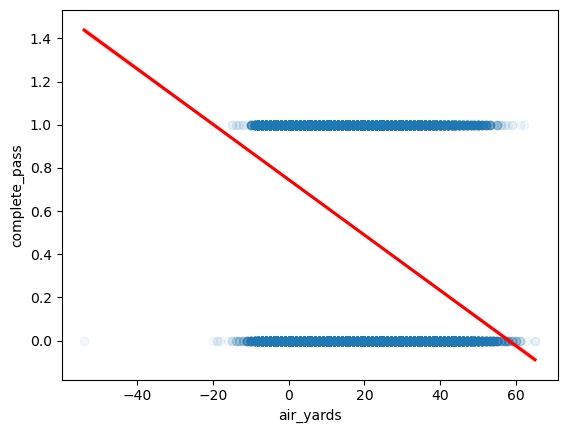

In [107]:
# regular linear regression is bad!
sns.regplot(data=pbp_pass, 
            x='air_yards',
            y='complete_pass',
            logistic=False,
            line_kws={'color':'red'},
            scatter_kws={'alpha':0.05})

<Axes: xlabel='air_yards', ylabel='complete_pass'>

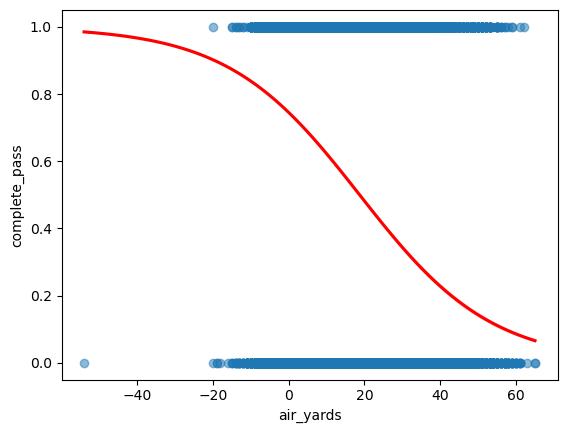

In [106]:
# logistic regression better
sns.regplot(data=pbp_pass, 
            x='air_yards',
            y='complete_pass',
            logistic=True,
            line_kws={'color':'red'},
            scatter_kws={'alpha':0.05})

In [108]:
pbp_pass['exp_completion'] = complete_ay.predict()
pbp_pass['cpoe'] = pbp_pass['complete_pass'] - pbp_pass['exp_completion']

In [110]:
cpoe = (
    pbp_pass.groupby(['season', 'passer_id', 'passer'])
    .agg({'cpoe': ['count', 'mean'], 'complete_pass': ['mean']})
)
cpoe.columns = flatten_grouped_cols(cpoe.columns)
cpoe = (
    cpoe.reset_index()
    .rename(columns={
        'cpoe_count': 'n',
        'cpoe_mean': 'cpoe',
        'complete_pass_mean': 'compl'
    })
    .query('n > 100')
)
cpoe.sort_values('cpoe', ascending=False)

,season,passer_id,passer,n,cpoe,compl
299,2019,00-0020531,D.Brees,406,0.094099,0.756158
193,2018,00-0020531,D.Brees,566,0.086476,0.738516
467,2020,00-0033537,D.Watson,542,0.073453,0.704797
465,2020,00-0033357,T.Hill,121,0.072505,0.727273
22,2016,00-0026143,M.Ryan,631,0.068933,0.702060
...,...,...,...,...,...,...
91,2016,00-0033106,J.Goff,204,-0.108739,0.549020
526,2021,00-0027939,C.Newton,126,-0.109908,0.547619
112,2017,00-0025430,D.Stanton,159,-0.110229,0.496855
730,2022,00-0037327,S.Thompson,150,-0.116812,0.520000


## Improving CPOE model

In [111]:
pbp_pass['down'] = pbp_pass['down'].astype(str)
pbp_pass['qb_hit'] = pbp_pass['qb_hit'].astype(str)

pbp_pass_no_miss = (
    pbp_pass[['season', 'passer_id', 'passer', 'down', 'qb_hit', 'complete_pass', 'ydstogo', 'yardline_100', 'air_yards', 'pass_location']]
    .dropna(axis=0)
)

In [113]:
complete_more = smf.glm(
    formula="complete_pass ~ down * ydstogo + yardline_100 + air_yards + pass_location + qb_hit",
    data=pbp_pass_no_miss,
    family=sm.families.Binomial(),
).fit()
complete_more.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                 Generalized Linear Model Regression Results                  
==============================================================================
Dep. Variable:          complete_pass   No. Observations:               131577
Model:                            GLM   Df Residuals:                   131564
Model Family:                Binomial   Df Model:                           12
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -78996.
Date:                Sun, 12 Nov 2023   Deviance:                   1.5799e+05
Time:                        16:15:51   Pearson chi2:                 1.32e+05
No. Iterations:                     5   Pseudo R-squ. (CS):            0.09864
Covariance Type:            nonrobust                                         
===========================================================================================
                              coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------------------
Intercept                   0.6214      0.048     12.890      0.000       0.527       0.716
down[T.2.0]                 0.1736      0.053      3.282      0.001       0.070       0.277
down[T.3.0]                -0.0881      0.052     -1.695      0.090      -0.190       0.014
down[T.4.0]                 0.1265      0.079      1.604      0.109      -0.028       0.281
pass_location[T.middle]     0.1615      0.016      9.930      0.000       0.130       0.193
pass_location[T.right]     -0.1093      0.014     -7.896      0.000      -0.136      -0.082
qb_hit[T.1.0]              -0.9809      0.020    -48.289      0.000      -1.021      -0.941
ydstogo                     0.0246      0.005      5.349      0.000       0.016       0.034
down[T.2.0]:ydstogo        -0.0194      0.005     -3.728      0.000      -0.030      -0.009
down[T.3.0]:ydstogo        -0.0087      0.005     -1.684      0.092      -0.019       0.001
down[T.4.0]:ydstogo        -0.0491      0.010     -4.940      0.000      -0.069      -0.030
yardline_100                0.0076      0.000     29.075      0.000       0.007       0.008
air_yards                  -0.0585      0.001    -91.988      0.000      -0.060      -0.057
===========================================================================================
"""

In [114]:
pbp_pass_no_miss['exp_completion'] = complete_more.predict()
pbp_pass_no_miss['cpoe'] = pbp_pass_no_miss['complete_pass'] - pbp_pass_no_miss['exp_completion']

In [115]:
cpoe_more = (
    pbp_pass_no_miss.groupby(['season', 'passer_id', 'passer'])
    .agg({'cpoe': ['count', 'mean'], 'complete_pass': ['mean']})
)
cpoe_more.columns = flatten_grouped_cols(cpoe_more.columns)
cpoe_more = (
    cpoe_more.reset_index()
    .rename(columns={
        'cpoe_count': 'n',
        'cpoe_mean': 'cpoe',
        'complete_pass_mean': 'compl'
    })
    .query('n > 100')
)
cpoe_more.sort_values('cpoe', ascending=False)

,season,passer_id,passer,n,cpoe,compl
193,2018,00-0020531,D.Brees,566,0.088924,0.738516
299,2019,00-0020531,D.Brees,406,0.087894,0.756158
465,2020,00-0033357,T.Hill,121,0.082978,0.727273
22,2016,00-0026143,M.Ryan,631,0.077565,0.702060
467,2020,00-0033537,D.Watson,542,0.072763,0.704797
...,...,...,...,...,...,...
390,2019,00-0035040,D.Blough,174,-0.100327,0.540230
506,2020,00-0036312,J.Luton,110,-0.107358,0.545455
91,2016,00-0033106,J.Goff,204,-0.112375,0.549020
526,2021,00-0027939,C.Newton,126,-0.123251,0.547619


## Is CPOE more stable than completion percentage?

In [116]:
cpoe_lag = lag_df(cpoe_more, index_cols=['season', 'passer_id', 'passer'], cols_to_lag=['cpoe', 'compl'], lag_on='season')

In [117]:
cpoe_lag[['compl', 'compl_last']].corr()

,compl,compl_last
compl,1.000000,0.445465
compl_last,0.445465,1.000000


In [118]:
cpoe_lag[['cpoe', 'cpoe_last']].corr()

,cpoe,cpoe_last
cpoe,1.000000,0.464974
cpoe_last,0.464974,1.000000


# 6. Data Science for Sports Betting: Poisson Regression and Passing Touchdowns

### Data Prep

In [120]:
pbp = pd.DataFrame(nfl.import_pbp_data(range(2016, 2022 + 1)))
criteria = 'passer_id.notnull()'
pbp_pass = (
    pbp.query(criteria)
    .reset_index()
)

2016 done.
2017 done.
2018 done.
2019 done.
2020 done.
2021 done.
2022 done.
Downcasting floats.


In [121]:
pbp_pass['pass_touchdown'] = pbp_pass['pass_touchdown'].fillna(0)
pbp_pass['passer'] = pbp_pass['passer'].fillna('none')
pbp_pass['passer_id'] = pbp_pass['passer_id'].fillna('none')

In [122]:
pbp_pass_td_y = (
    pbp_pass.groupby(['season', 'week', 'passer_id', 'passer'])
    .agg({'pass_touchdown': ['sum'], 'total_line':['count', 'mean']})
)
pbp_pass_td_y.columns = flatten_grouped_cols(pbp_pass_td_y.columns)
pbp_pass_td_y = (
    pbp_pass_td_y.reset_index()
    .rename(columns={
        'pass_touchdown_sum': 'pass_td_y',
        'total_line_mean': 'total_line',
        'total_line_count': 'n_passes',
    })
    .query('n_passes >= 10')
)

In [123]:
pbp_pass_td_y.groupby('pass_td_y').agg({'n_passes':'count'})

,n_passes
pass_td_y,
0.0,902
1.0,1286
2.0,1050
3.0,506
4.0,186
5.0,31
6.0,4


In [124]:
pbp_pass_td_y.describe()

,season,week,pass_td_y,n_passes,total_line
count,3965.000000,3965.000000,3965.000000,3965.000000,3965.000000
mean,2019.048928,9.620177,1.469609,38.798487,45.770618
std,2.008968,5.391064,1.164081,10.620958,4.409121
min,2016.000000,1.000000,0.000000,10.000000,32.000000
25%,2017.000000,5.000000,1.000000,32.000000,42.500000
50%,2019.000000,10.000000,1.000000,39.000000,45.500000
75%,2021.000000,14.000000,2.000000,46.000000,48.500000
max,2022.000000,22.000000,6.000000,84.000000,63.500000


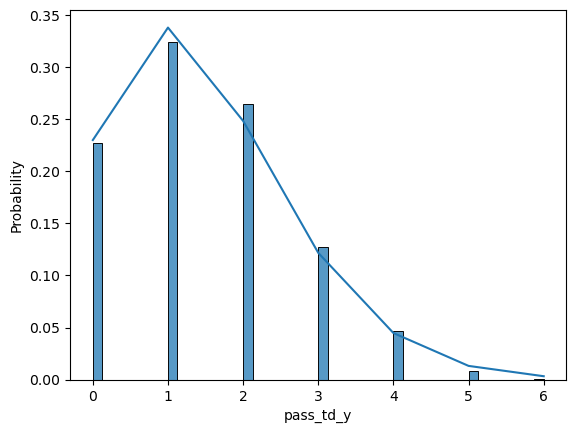

In [126]:
pass_td_y_mean = pbp_pass_td_y['pass_td_y'].mean()

plot_pos = pd.DataFrame({
            'x': range(7),
            'expected':[poisson.pmf(x, pass_td_y_mean) for x in range(7)]
        })

sns.histplot(pbp_pass_td_y['pass_td_y'], stat='probability')
plt.plot(plot_pos.x, plot_pos.expected)
plt.show()

# 7. Web Scraping: Obtaining and Analyzing Draft Picks

# 8. PCA and Clustering: Player Attributes

# 9. Advanced Tools and Next Steps